In [1]:
# import libraries
import pandas as pd
import geopandas as gpd

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

import contextily as ctx

# for interactive plots, similar to geopands (your choice between folium vs plotly)
import plotly.express as px

# to import open data - in order to use the API links in some of the gov websites
from sodapy import Socrata

import requests

In [2]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# Specify the year you want to retrieve
year = 2020

# Construct SoQL query to filter data by date range for the specified year
query = f"SELECT * WHERE date_occ >= '{2020}-01-01T00:00:00.000' AND date_occ < '{2020 + 1}-01-01T00:00:00.000'"


# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy. 250,000 would take a long time to upload/be slow
results = client.get("d5tf-ez2w", query = query)

# Convert to pandas DataFrame containing 2020 collisions data
df = pd.DataFrame.from_records(results)

# LA Traffic Collisions in 2020 Overview
We're going to take a look at where all of the traffic incidents reported to the police in 2020 occurred in Los Angeles. This particular year, 42,382 accidents were reported. Overall, we can see that there is just a bit too much data to make sense of any patterns and trends. In the following sections we'll dig a bit deeper. 


In [29]:
#Let's use CSV for data import in order to increase data input to 43k, instead of API limit of 1000. 
tcd = pd.read_csv('Traffic_Collisions_2020.csv')

#lets fix the spaces in the variable names 
tcd.rename(columns={'old column name with spaces': 'new_column_name',
                    'Victim Age' : 'victim_age',
                    'Victim Sex' : 'victim_sex',
                    'Victim Descent' : 'victim_descent'
                   }, inplace=True)

In [30]:
tracts = gpd.read_file('Census_Tracts_2020.geojson')

In [34]:
# convert df to gdf
# since data is in lat/lon's assign the crs to WGS84 (epsg:4326)
gtcd = gpd.GeoDataFrame(tcd, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(tcd.Longitude, tcd.Latitude))

# output the data's projection
gtcd.crs

#calculate the bounding box we're starting with
bbox = gtcd.total_bounds

In [35]:
#calculate the bounding box for LA City - change to our data frame? Use these numbers to clip, and cut out that outlier data piece. 
bbox = tracts.total_bounds

#print the bounding box
print("Bounding Box:")
print("min Longitude:", bbox[0])
print("min Latitude:", bbox[1])
print("max Longitude:", bbox[2])
print("max Latitude:", bbox[3])

Bounding Box:
min Longitude: -118.94519230312248
min Latitude: 32.75004470004891
max Longitude: -117.64638610517382
max Latitude: 34.823306968227755


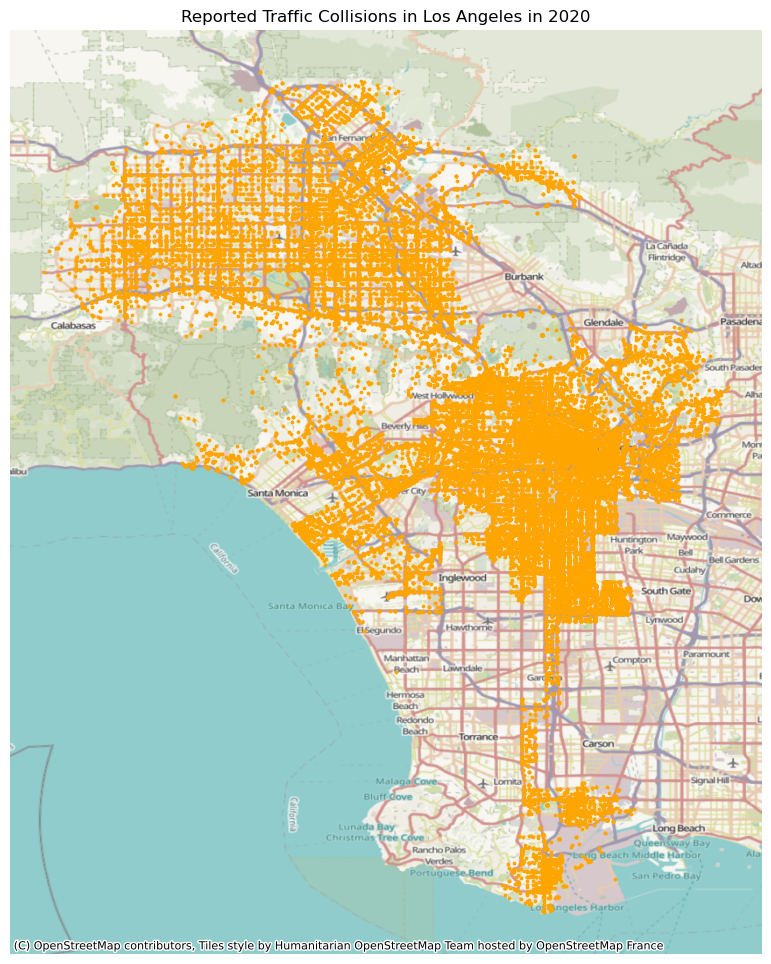

In [36]:
# start the plot (this code doesn't work here) 
fig, ax = plt.subplots(figsize=(12,12)) # figure size is size of axes lengith 12, creating an empty plot. 

# add the data options - cliping the bounds to meet the bounds of USA on map (total bounds of usa)
ax = gtcd.clip([-119,33,-118,35]).plot(ax=ax, # our empty plot is now being set to gdf which has all the data in it. 
        marker='o', #what is the marker we want to use for every xy point (literally an x)
        markersize= 3, #font size of the point
        color='orange') # color of the marker

# turn the axes off
ax.axis('off') #

# give it a title
ax.set_title('Reported Traffic Collisions in Los Angeles in 2020')

# add a basemap - add this to the plot above, and that projected in the same system as above
ctx.add_basemap(ax, crs=4326) # note that we must specify the projection here (crs)

# Exploring demographics of persons invovled in Traffic Collisions during 2020

In [38]:
vsex = getattr(tcd,'victim_sex').unique().tolist()
print(vsex)
# Key/Meta data information
# Victim's Sex: NaN, X, H are all missing values.

['F', 'M', nan, 'X', 'H']


### Victim Sex

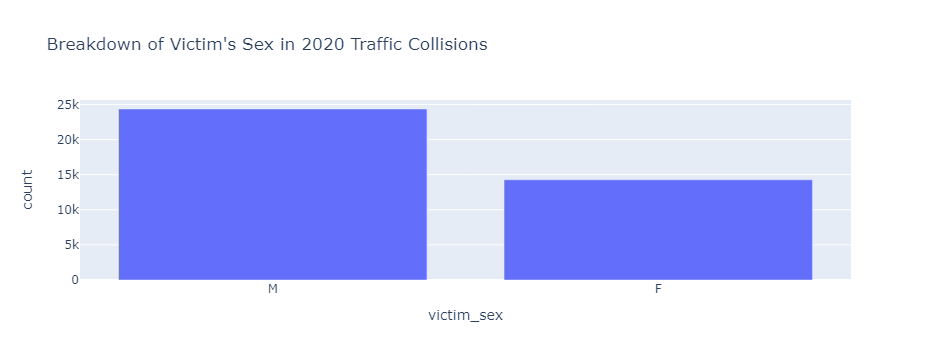

In [56]:
sex_count = tcd.value_counts('victim_sex').reset_index(name = 'count')

# Remove observations containing 'H' and 'X'
sex_count_filtered = sex_count[(sex_count['victim_sex'] != 'X') & (sex_count['victim_sex'] != 'H')]

# plot the info
fig = px.bar(sex_count_filtered,
    x='victim_sex',
    y='count', 
    title = "Breakdown of Victim's Sex in 2020 Traffic Collisions")
fig.show()

Men had a significantly higher victim count than women with regards to being involved in an accident. 

**Male Count  = 24,62**
**Female Count nt = 14,**4 


### Victim Descent 

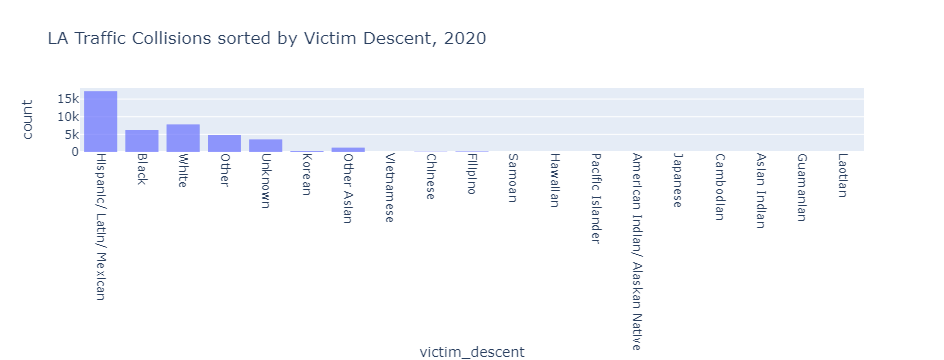

In [49]:
vdescent = getattr(tcd,'victim_descent').unique().tolist()

#add labels by providing a dict
fig = px.bar(
        tcd,
        x='victim_descent',
        title='LA Traffic Collisions sorted by Victim Descent, 2020'
)

# Specify the new labels
new_labels = {
            'A' : 'Other Asian',
            'B' : 'Black',
            'C' : 'Chinese',
            'D' : 'Cambodian',
            'F' : 'Filipino',
            'G' : 'Guamanian',
            'H' : 'Hispanic/ Latin/ Mexican',
            'I' : 'American Indian/ Alaskan Native',
            'J' : 'Japanese',
            'K' : 'Korean',
            'L' : 'Laotian',
            'O' : 'Other',
            'P' : 'Pacific Islander',
            'S' : 'Samoan',
            'U' : 'Hawaiian',
            'V' : 'Vietnamese',
            'W' : 'White',
            'X' : 'Unknown',
            'Z' : 'Asian Indian'  
        }

# Update x-axis labels
#fig.update_xaxes(categoryorder='array', categoryarray=[new_labels.get(cat, cat) for cat in categories])

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(new_labels.keys()),
        ticktext = list(new_labels.values())
    )
)
fig.update_xaxes(tickangle=90)

# show the figure
fig.show()

People of Hispanic/Latin/ Mexican descent had the highest count with traffic accidents. 

## Victim Ages

<Axes: title={'center': 'LA Traffic collisions sorted by Victim Age'}, xlabel='age_by_cat'>

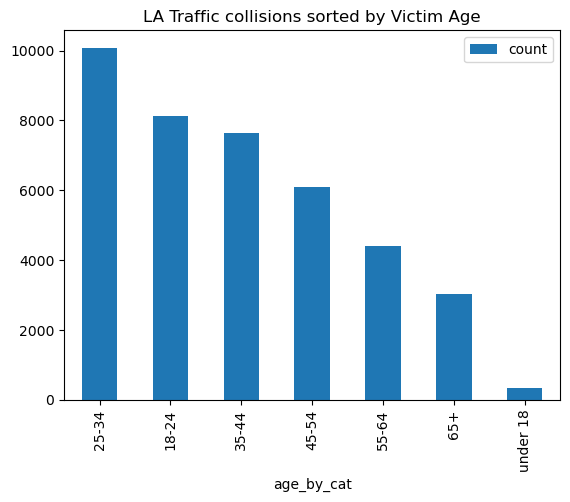

In [53]:
## Collision Victim Ages 
age_raw_count = tcd.value_counts('victim_age').reset_index(name = 'count')

#For Loop to recategorize age: 
age_cat = []
for age in tcd['victim_age']: 
    if pd.isnull(age):  # Check if age is missing
        age_cat.append('NaN')  # Append 'Missing' category
        #missing_count += 1  # Increment missing count
    elif age < 18: 
        age_cat.append('under 18')
    elif 18 <= age <= 24: 
        age_cat.append('18-24')
    elif 25 <= age <= 34:
        age_cat.append('25-34')
    elif 35 <= age <= 44:
        age_cat.append('35-44')
    elif 45 <= age <= 54: 
        age_cat.append('45-54')
    elif 55 <= age <= 64:
        age_cat.append('55-64')
    elif age >= 65:
        age_cat.append('65+')
# add this new variable to the dataframe next
tcd['age_by_cat'] = age_cat

#check to see if added to data frame correctly
# tcd.head(2)

age_count = tcd.value_counts('age_by_cat').reset_index(name = 'count')

# Remove observations containing 'NaN'
age_count_filtered = age_count[(age_count['age_by_cat'] != 'NaN')]

#create a bar graph of the traffic collisions sorted by age
age_count_filtered.plot.bar(x='age_by_cat',
                   y='count',
                   title='LA Traffic collisions sorted by Victim Age')

Drivers between the ages of 25-34 had the highest accident rates in LA City in 2020!

# Interactive Maps

### Overview of Traffic Collision Locations

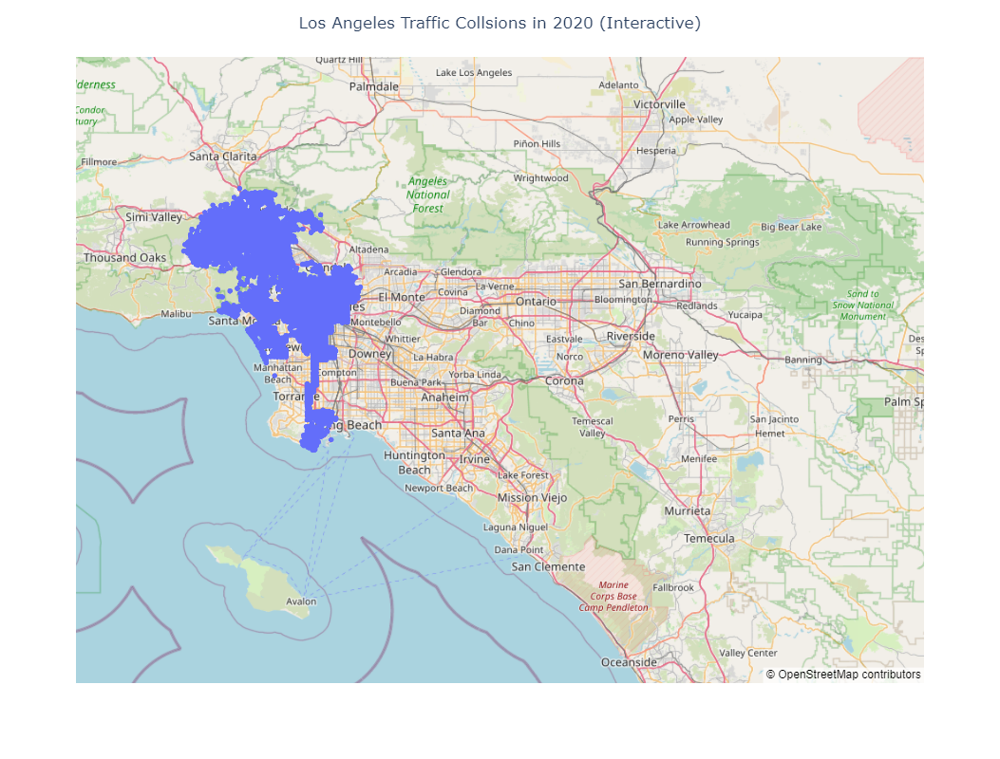

In [118]:
fig = px.scatter_mapbox(tcd, #can change style, similar to contextly's maps. 
                        lat='Latitude',
                        lon='Longitude',
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Los Angeles Traffic Collsions in 2020 (Interactive)",
    title_x=0.5 # aligns title to center
)

fig.show()

### Mapping Accidents by Location and Sex (2020) 

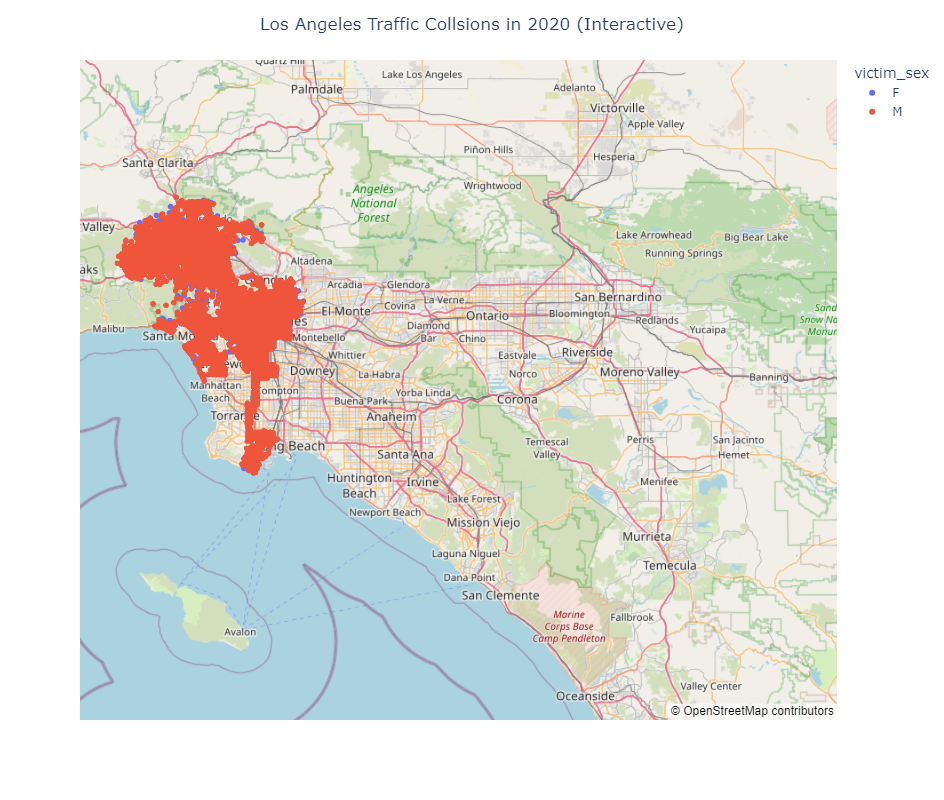

In [55]:
# Remove observations with 'victim_sex' equal to 'X' or 'H'
filtered_sex = tcd[(tcd['victim_sex'] != 'X') & (tcd['victim_sex'] != 'H')]

fig = px.scatter_mapbox(filtered_sex, 
                        lat='Latitude',
                        lon='Longitude',
                        color='victim_sex',
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Los Angeles Traffic Collsions in 2020 (Interactive)",
    title_x=0.5 # aligns title to center
)

fig.show()

### Mapping Accidents by Location and Age (2020)

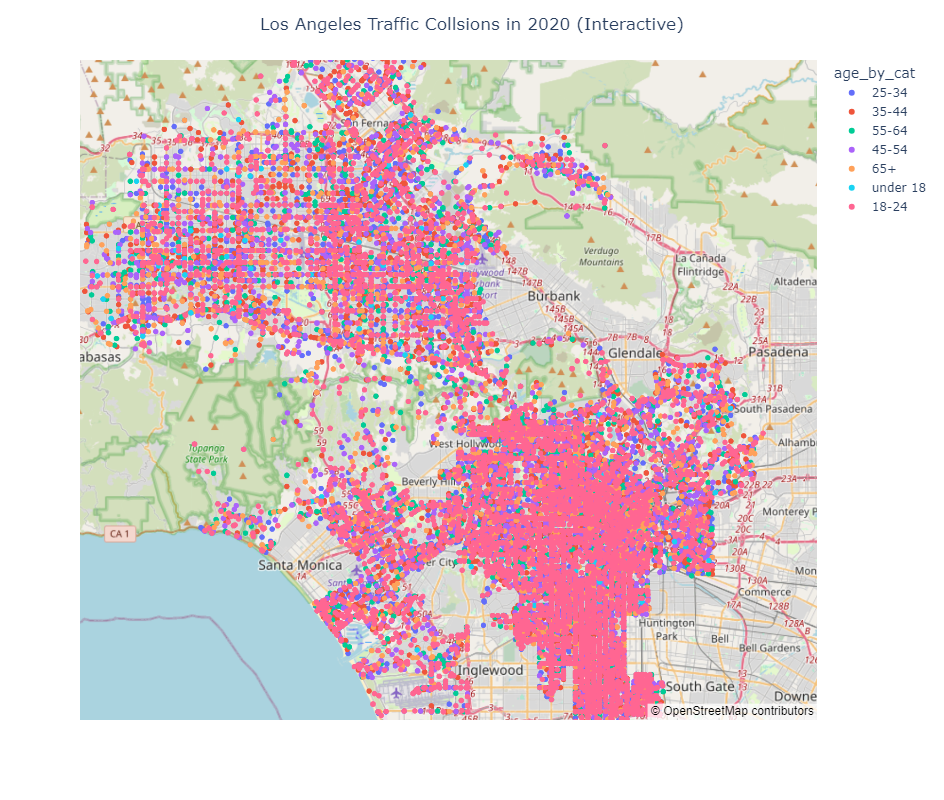

In [126]:
#dropping the nan values in order to display better on map
df_age_cleaned = tcd[tcd['age_by_cat'] != 'NaN']
df_age_cleaned.age_by_cat.unique().tolist()

#create plot
fig = px.scatter_mapbox(df_age_cleaned,
                        lat='Latitude',
                        lon='Longitude',
                        color='age_by_cat',
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Los Angeles Traffic Collsions in 2020 (Interactive)",
    title_x=0.5 # aligns title to center
)

fig.show()

### Mapping Accidents by Location and Race (2020)

In [58]:
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            tcd[tcd.victim_descent==race], 
                            lat="Latitude", 
                            lon="Longitude", 
                            color="victim_descent",
                            labels={'victim_descent':'Race'},
                            mapbox_style="carto-positron"
    )

    # options on the layout
    fig.update_layout(
        width = 600,
        height = 600,
        title = "2020 Interactive Traffic Collisions Map <br>Showing where descent label is "+race,
        title_x=0.5 # aligns title to center
    )

    fig.show()

# get a list of distinct race values
race_list = tcd.victim_descent.unique().tolist()
#remove nan value - its preventing for loop working later. 
race_list_clean = [x for x in race_list if not pd.isnull(x)]
print(race_list_clean)

['H', 'B', 'W', 'O', 'X', 'K', 'A', 'V', 'C', 'F', 'S', 'U', 'P', 'I', 'J', 'D', 'Z', 'G', 'L']


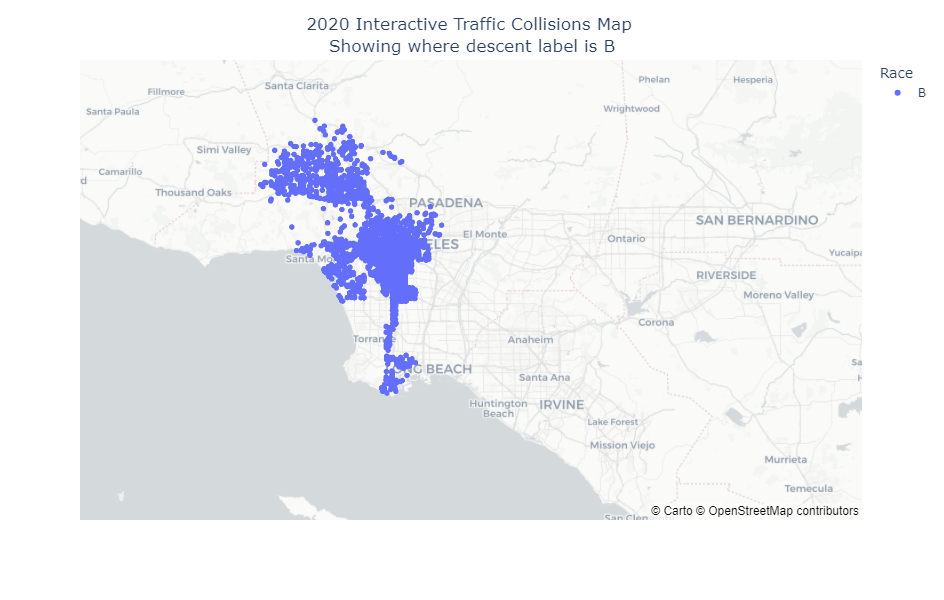

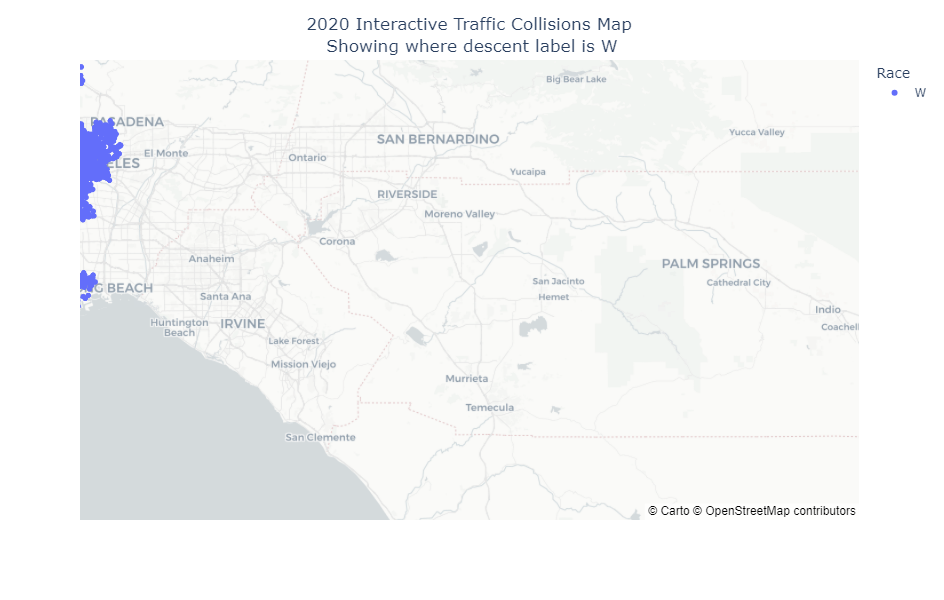

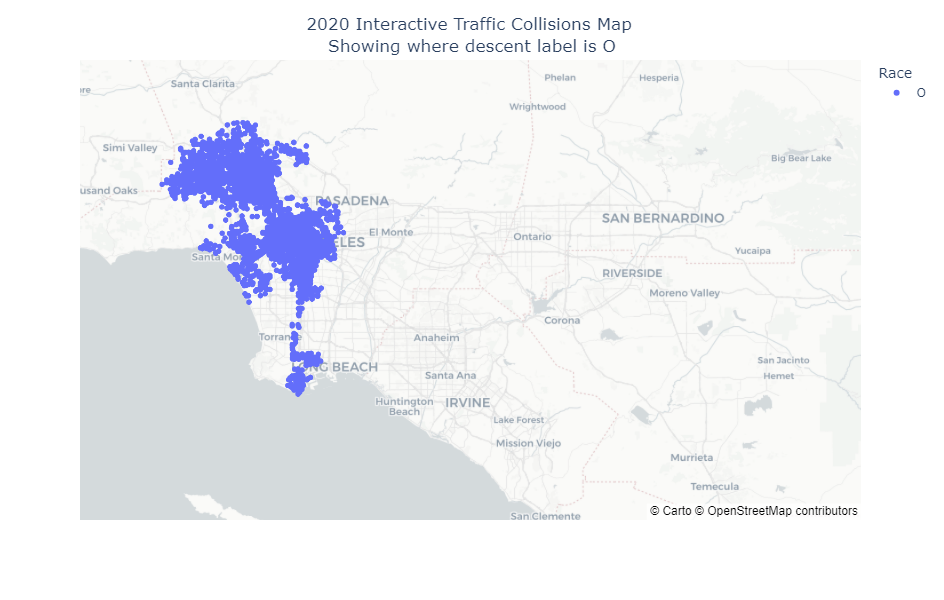

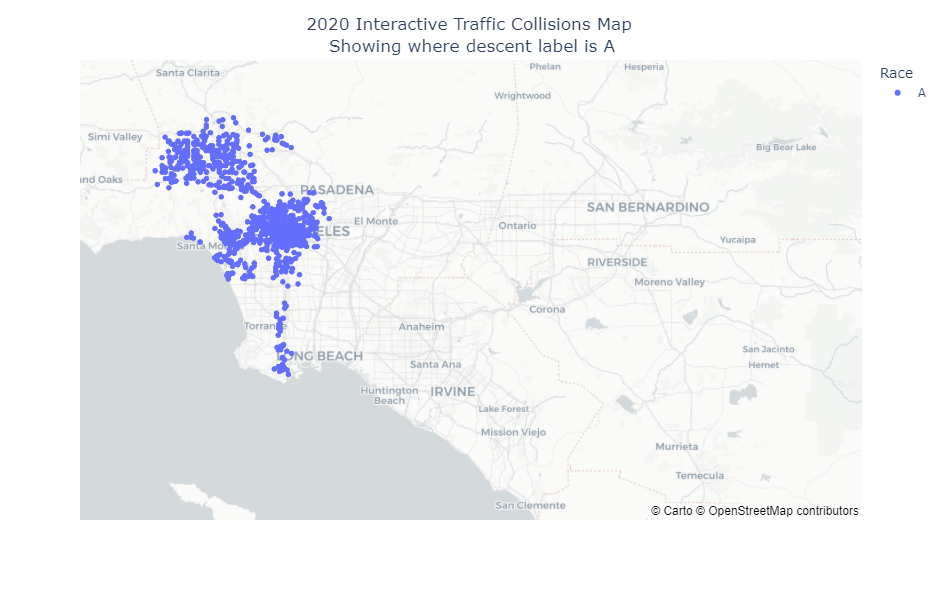

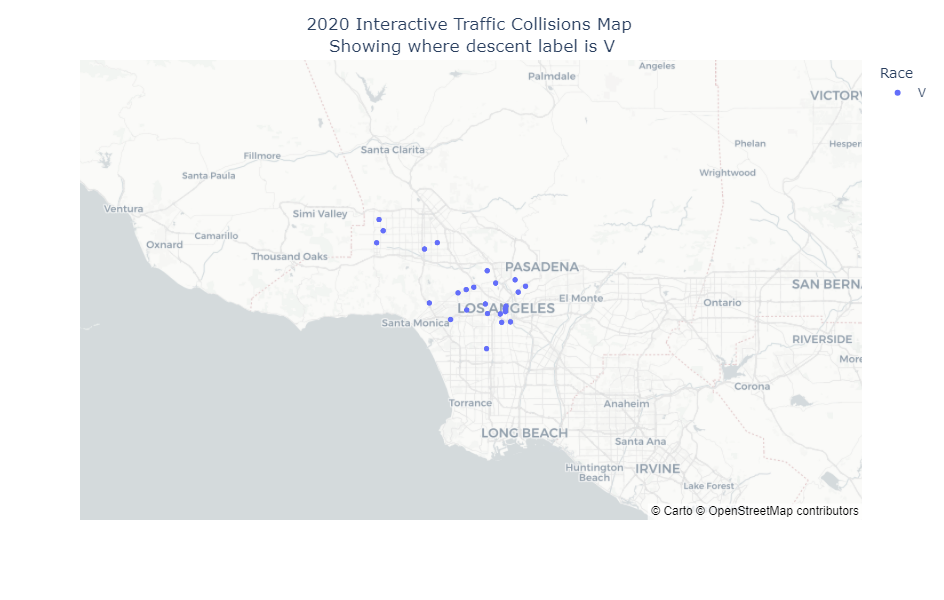

...

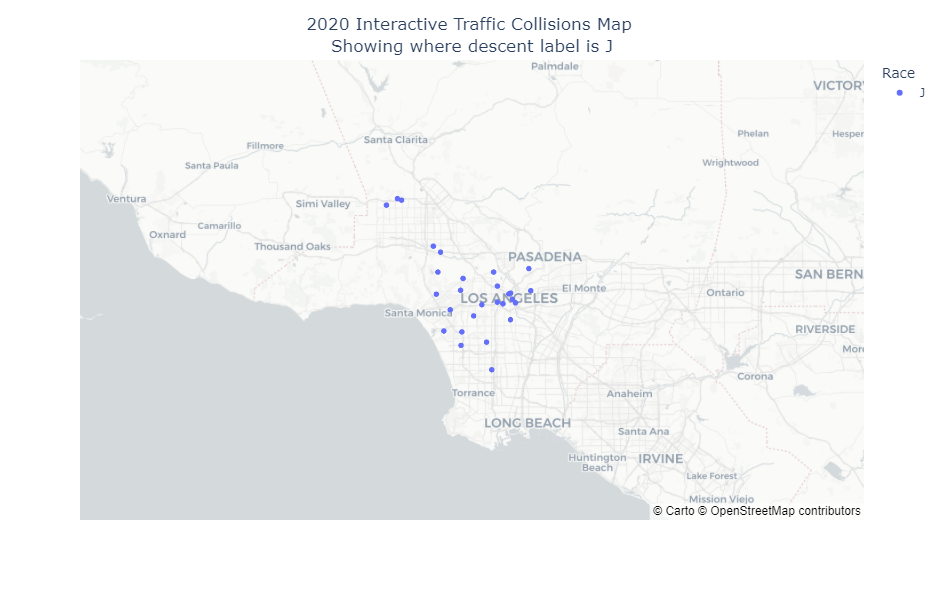

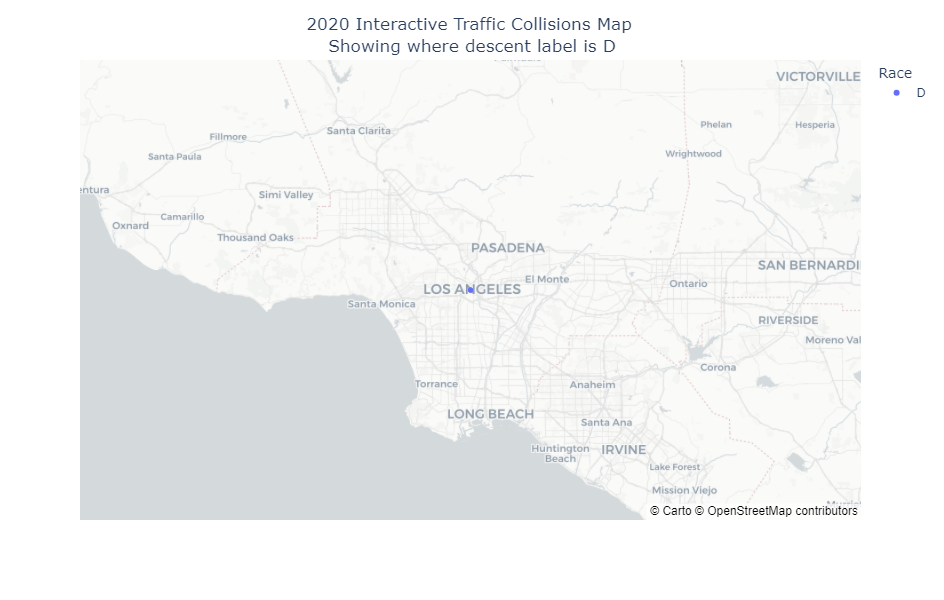

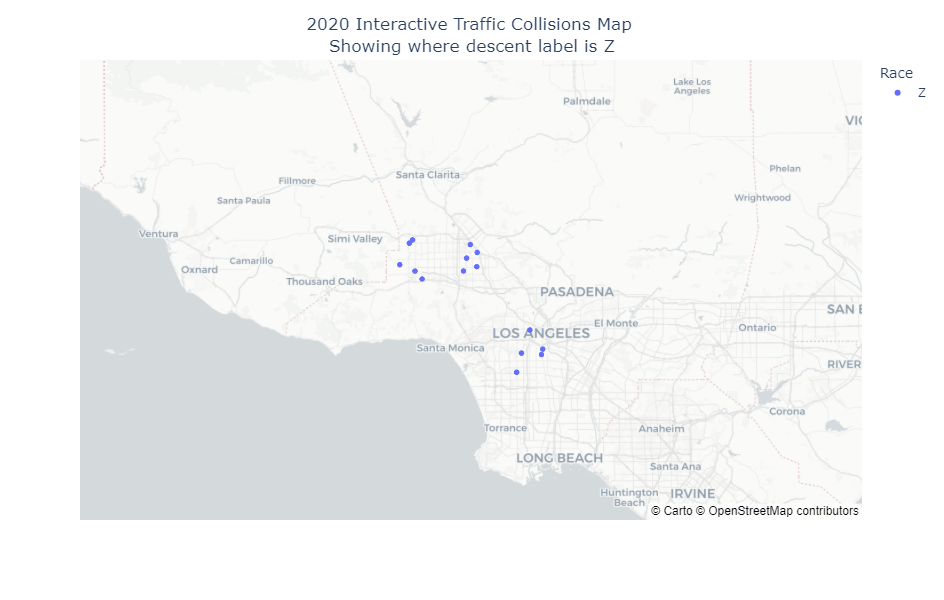

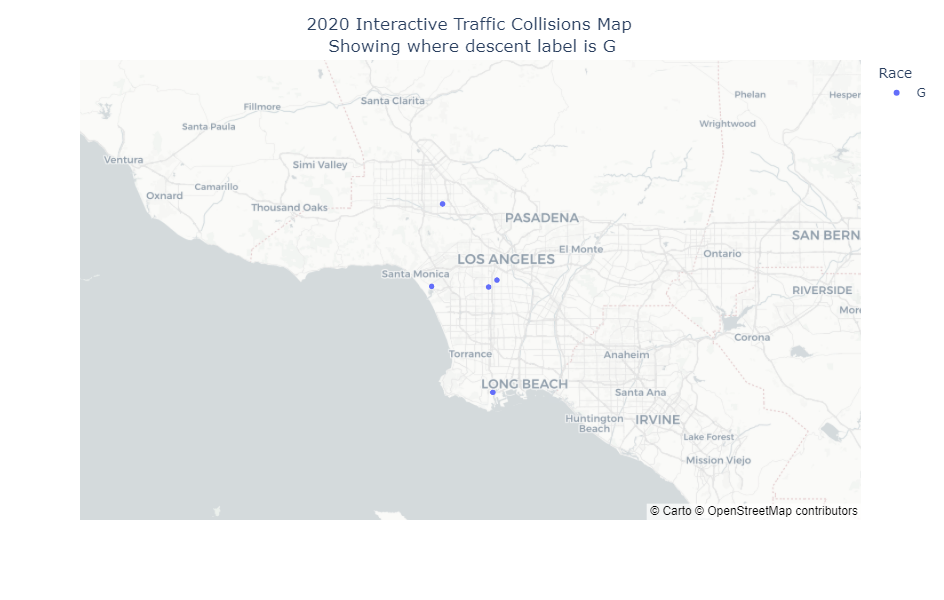

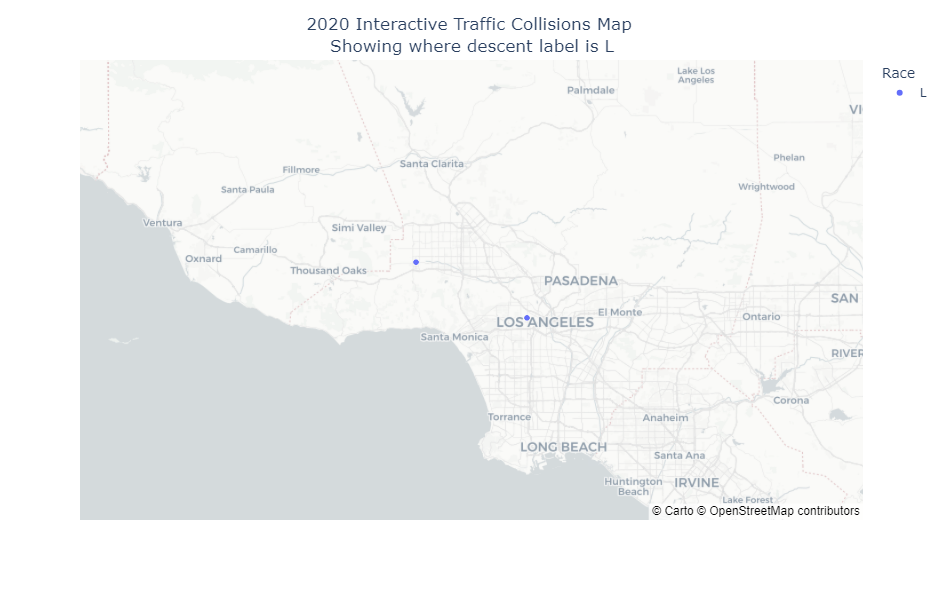

In [59]:
# loop and map!
for race in race_list_clean:
    race_map(race)

In [ ]:
Whoo! that was a lot! 